<a href="https://colab.research.google.com/github/Nirzaree/automating-lulc-classification-using-python/blob/master/LULC_Bangalore_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [29]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [26]:
import ee

In [27]:
ee.Authenticate()

In [28]:
ee.Initialize(project='ee-nirzareephotos')

### Download boundary

In [30]:
ISO = 'IND'
ADM = 'ADM2'
RELEASE_TYPE = 'gbOpen'

In [31]:
import requests

In [33]:
# Query geoBoundaries
r = requests.get('https://www.geoboundaries.org/api/current/{}/{}/{}/'.format(RELEASE_TYPE,ISO,ADM))


In [34]:
dl_path = r.json()['gjDownloadURL']

In [35]:
filename = 'geoboundary.geojson'

In [36]:
geoboundary = requests.get(dl_path).json()

In [22]:
# !pip install geojson

In [23]:
import geojson

In [37]:
with open(filename,'w') as file:
  geojson.dump(geoboundary,file)

In [19]:
import geopandas as gpd

In [38]:
geoboundary = gpd.read_file(filename)

In [39]:
geoboundary.shape

(735, 6)

In [ ]:
geoboundary.head()

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Ashoknagar,,76128533B75548370501185,IND,ADM2,"POLYGON ((78.17491 24.84254, 78.17466 24.84194..."
1,Raisen,,76128533B57893545331548,IND,ADM2,"POLYGON ((77.38167 23.07004, 77.38094 23.0698,..."
2,Chhindwara,,76128533B70646408240587,IND,ADM2,"POLYGON ((79.23988 22.79135, 79.24 22.79172, 7..."
3,Betul,,76128533B82559220423608,IND,ADM2,"POLYGON ((78.27229 22.39973, 78.27169 22.39897..."
4,Hoshangabad,,76128533B45314020251888,IND,ADM2,"POLYGON ((78.03027 22.79953, 78.02986 22.79969..."


In [ ]:
geoboundary[geoboundary['shapeName'].str.contains('Bangalore')]

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
441,Bangalore Rural,,76128533B48075109668277,IND,ADM2,"POLYGON ((77.38765 13.50108, 77.38628 13.49903..."
445,Bangalore,,76128533B76927648517269,IND,ADM2,"POLYGON ((77.32755 12.9958, 77.3279 12.99478, ..."


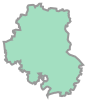

In [ ]:
geoboundary[geoboundary['shapeName'] == 'Bangalore'].iloc[0]['geometry']

### Generate Sentinel2 satellite images

In [ ]:
def generate_image(
    region,
    product='COPERNICUS/S2_SR',
    min_date='2023-01-01',
    max_date='2024-01-01',
    range_min=0,
    range_max=2000,
    cloud_pct=10
):

    """Generates cloud-filtered, median-aggregated
    Sentinel-2 image from Google Earth Engine using the
    Pythin Earth Engine API.

    Args:
      region (ee.Geometry): The geometry of the area of interest to filter to.
      product (str): Earth Engine asset ID
        You can find the full list of ImageCollection IDs
        at https://developers.google.com/earth-engine/datasets
      min_date (str): Minimum date to acquire collection of satellite images
      max_date (str): Maximum date to acquire collection of satellite images
      range_min (int): Minimum value for visalization range
      range_max (int): Maximum value for visualization range
      cloud_pct (float): The cloud cover percent to filter by (default 10)

    Returns:
      ee.image.Image: Generated Sentinel-2 image clipped to the region of interest
    """

    # Generate median aggregated composite
    image = ee.ImageCollection(product)\
        .filterBounds(region)\
        .filterDate(str(min_date), str(max_date))\
        .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", cloud_pct))\
        .median()

    # Get RGB bands
    image = image.visualize(bands=['B4', 'B3', 'B2'], min=range_min, max=range_max)
    # Note that the max value of the RGB bands is set to 65535
    # because the bands of Sentinel-2 are 16-bit integers
    # with a full numerical range of [0, 65535] (max is 2^16 - 1);
    # however, the actual values are much smaller than the max value.
    # Source: https://stackoverflow.com/a/63912278/4777141

    return image.clip(region)

In [106]:
# !pip install eeconvert

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.1/139.1 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 101.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.6/82.6 kB 7.5 MB/s eta 0:00:00


In [107]:
import eeconvert as eec

In [108]:
# Get the shape geometry for Bangalore
region  = geoboundary.loc[geoboundary.shapeName == shape_name]
centroid = region.iloc[0].geometry.centroid.coords[0]
region = eec.gdfToFc(region) #geodataframe to feature collection


In [ ]:
# Generate RGB image using GEE
image = generate_image(
    region,
    product='COPERNICUS/S2', # Sentinel-2A
    min_date='2024-01-01', # Get all images within
    max_date='2024-10-01', # the year 2021
    cloud_pct=10, # Filter out images with cloud cover >= 10.0%
)

In [ ]:
import geemap.core as geemap

In [ ]:
# Visualize map
Map = geemap.Map(center=[centroid[1], centroid[0]], zoom=10)
Map.addLayer(image, {}, 'Sentinel2')
# Map.addLayerControl()
Map

Map(center=[12.949137851340922, 77.58283692401933], controls=(ZoomControl(options=['position', 'zoom_in_text',…

In [40]:
def export_image(image, filename, region, folder):
    """Export Image to Google Drive.

    Args:
      image (ee.image.Image): Generated Sentinel-2 image
      filename (str): Name of image, without the file extension
      geometry (ee.geometry.Geometry): The geometry of the area of
        interest to filter to.
      folder (str): The destination folder in your Google Drive.

    Returns:
      ee.batch.Task: A task instance
    """

    print('Exporting to {}.tif ...'.format(filename))

    task = ee.batch.Export.image.toDrive(
      image=image,
      driveFolder=folder,
      scale=10,
      region=region.geometry(),
      description=filename,
      fileFormat='GeoTIFF',
      crs='EPSG:4326',
      maxPixels=900000000
    )
    task.start()

    return task

In [11]:
folder = '/content/drive/MyDrive/CCAI 2024 Tutorials/2_automate_LULC_in_python/' # Change this to your file destination folder in Google drive
task = export_image(image, shape_name, region, folder)

In [ ]:
task.status()

{'state': 'COMPLETED',
 'description': 'Bangalore',
 'priority': 100,
 'creation_timestamp_ms': 1728473334272,
 'update_timestamp_ms': 1728473710265,
 'start_timestamp_ms': 1728473339131,
 'task_type': 'EXPORT_IMAGE',
 'destination_uris': ['https://drive.google.com/#folders/1H5b-u6k44IBVyshZK2wAuN73vD0kwjeR'],
 'attempt': 1,
 'batch_eecu_usage_seconds': 1132.733154296875,
 'id': 'AJ5AM2RPP4DLR2HC2V4ZKLPF',
 'name': 'projects/ee-nirzareephotos/operations/AJ5AM2RPP4DLR2HC2V4ZKLPF'}

In [9]:
# !pip install rasterio

In [8]:
import rasterio as rio
import matplotlib.pyplot as plt
from rasterio.plot import show

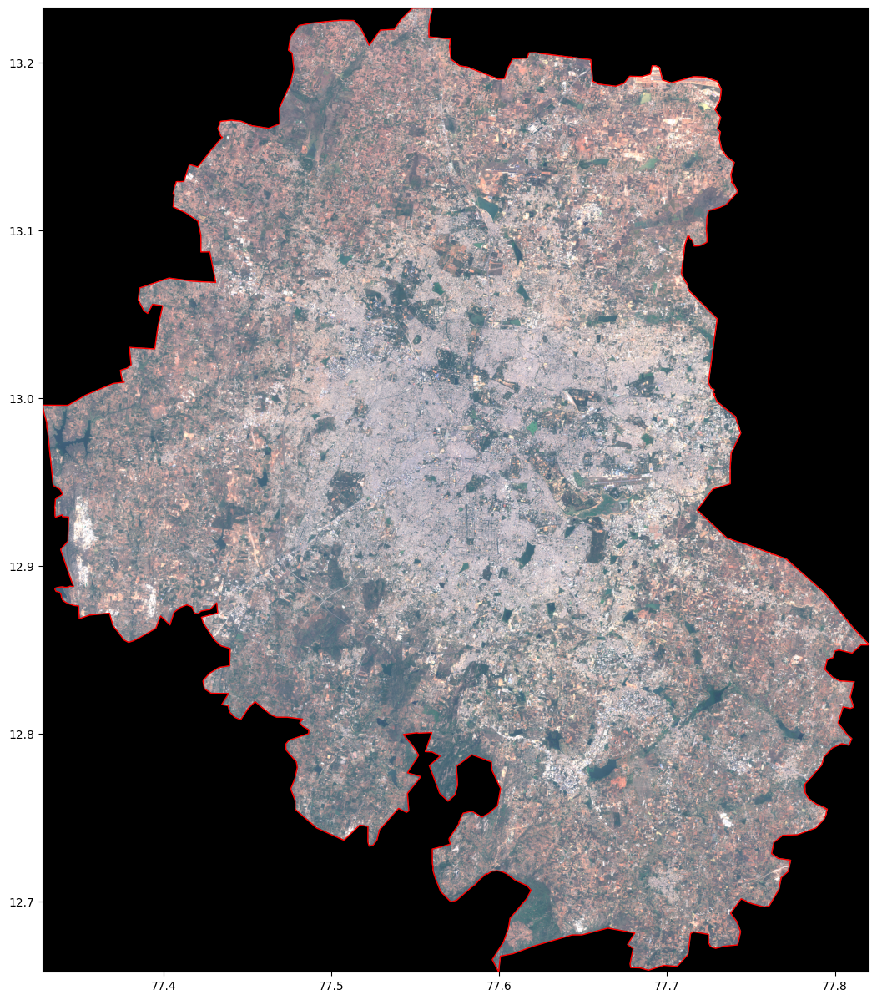

In [41]:
# Change this to your image file path
cwd = folder
tif_file = cwd + '{}.tif'.format(shape_name)

# Open image file using Rasterio
image = rio.open(tif_file)
boundary = geoboundary[geoboundary.shapeName == shape_name]

# Plot image and corresponding boundary
fig, ax = plt.subplots(figsize=(15,15))
boundary.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

### Generate 64 x 64 patches/tiles

In [42]:
from tqdm import tqdm
import pandas as pd
from shapely.geometry import box

In [43]:
def generate_tiles(image_file, output_file, area_str, size=64):
    """Generates 64 x 64 polygon tiles.

    Args:
      image_file (str): Image file path (.tif)
      output_file (str): Output file path (.geojson)
      area_str (str): Name of the region
      size(int): Window size

    Returns:
      GeoPandas DataFrame: Contains 64 x 64 polygon tiles
    """

    # Open the raster image using rasterio
    raster = rio.open(image_file)
    width, height = raster.shape

    # Create a dictionary which will contain our 64 x 64 px polygon tiles
    # Later we'll convert this dict into a GeoPandas DataFrame.
    geo_dict = { 'id' : [], 'geometry' : []}
    index = 0

    # Do a sliding window across the raster image
    with tqdm(total=width*height) as pbar:
      for w in range(0, width, size):
          for h in range(0, height, size):
              # Create a Window of your desired size
              window = rio.windows.Window(h, w, size, size)
              # Get the georeferenced window bounds
              bbox = rio.windows.bounds(window, raster.transform)
              # Create a shapely geometry from the bounding box
              bbox = box(*bbox)

              # Create a unique id for each geometry
              uid = '{}-{}'.format(area_str.lower().replace(' ', '_'), index)

              # Update dictionary
              geo_dict['id'].append(uid)
              geo_dict['geometry'].append(bbox)

              index += 1
              pbar.update(size*size)

    # Cast dictionary as a GeoPandas DataFrame
    results = gpd.GeoDataFrame(pd.DataFrame(geo_dict))
    # Set CRS to EPSG:4326
    results.crs = {'init' :'epsg:4326'}
    # Save file as GeoJSON
    results.to_file(output_file, driver="GeoJSON")

    raster.close()
    return results

In [83]:
output_file = cwd+'{}.geojson'.format(shape_name)
tiles = generate_tiles(tif_file, output_file, shape_name, size=64)
print('Data dimensions: {}'.format(tiles.shape))
tiles.head(3)

35225600it [00:00, 128656109.52it/s]                              
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:143: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


Data dimensions: (8600, 2)


,id,geometry
0,bangalore-0,"POLYGON ((77.33327 13.22688, 77.33327 13.23263..."
1,bangalore-1,"POLYGON ((77.33902 13.22688, 77.33902 13.23263..."
2,bangalore-2,"POLYGON ((77.34477 13.22688, 77.34477 13.23263..."


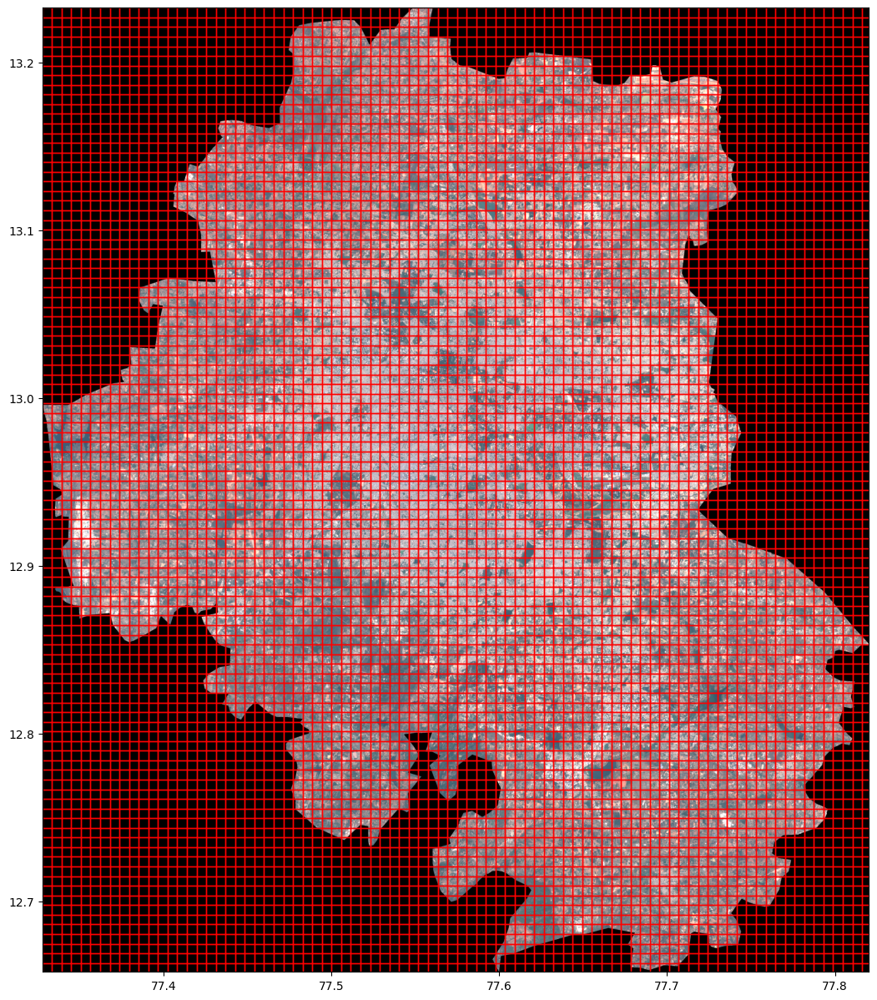

In [84]:
image = rio.open(tif_file)
fig, ax = plt.subplots(figsize=(15,15))
tiles.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

<ipython-input-85-c55e733b947d>:4: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  tiles = gpd.sjoin(tiles, boundary,how = 'inner',predicate = 'within')


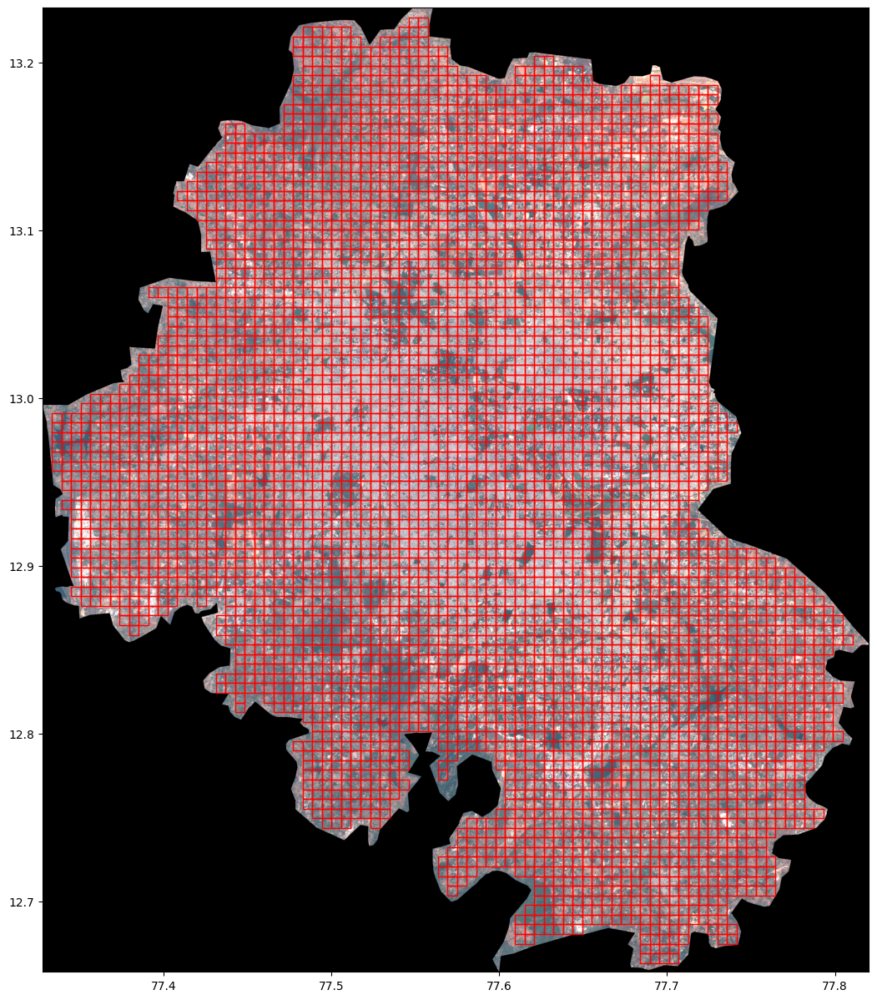

In [85]:
image = rio.open(tif_file)

# Geopandas sjoin function
tiles = gpd.sjoin(tiles, boundary,how = 'inner',predicate = 'within')

fig, ax = plt.subplots(figsize=(15,15))
tiles.plot(facecolor="none", edgecolor='red', ax=ax)
show(image, ax=ax);

In [86]:
import numpy as np
import rasterio.mask

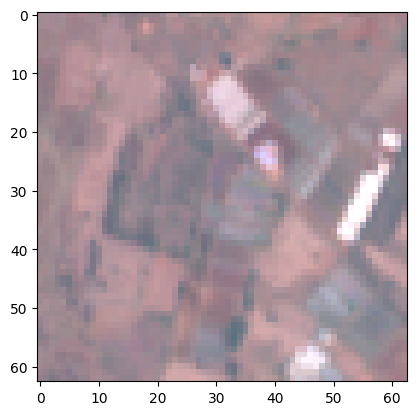

In [88]:
def show_crop(image, shape, title=''):
  """Crops an image based on the polygon shape.
  Reference: https://rasterio.readthedocs.io/en/latest/api/rasterio.mask.html#rasterio.mask.mask

  Args:
    image (str): Image file path (.tif)
    shape (geometry): The tile with which to crop the image
    title(str): Image title
  """

  with rio.open(image) as src:
      out_image, out_transform = rio.mask.mask(src, shape, crop=True)
      # Crop out black (zero) border
      _, x_nonzero, y_nonzero = np.nonzero(out_image)
      out_image = out_image[
        :,
        np.min(x_nonzero):np.max(x_nonzero),
        np.min(y_nonzero):np.max(y_nonzero)
      ]
      # Visualize image
      show(out_image, title=title)

show_crop(tif_file, [tiles.iloc[10]['geometry']])

In [89]:
# LULC Classes
classes = [
  'AnnualCrop',
  'Forest',
  'HerbaceousVegetation',
  'Highway',
  'Industrial',
  'Pasture',
  'PermanentCrop',
  'Residential',
  'River',
  'SeaLake'
]

In [58]:
import torch
from torchvision import datasets, models, transforms

In [56]:
model_dir = '/content/drive/MyDrive/CCAI 2024 Tutorials/1_LULC_ResNET50/model'

In [60]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_file = model_dir+'/best_model.pth'

model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, 10)
model.load_state_dict(torch.load(model_file, map_location=device))
model.eval()

print('Model file {} successfully loaded.'.format(model_file))

<ipython-input-60-8fba27c3a6e6>:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_file, map_location=device))


Model file /content/drive/MyDrive/CCAI 2024 Tutorials/1_LULC_ResNET50/model/best_model.pth successfully loaded.


In [90]:
imagenet_mean, imagenet_std = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std)
])

In [62]:
from PIL import Image

In [91]:
def predict_crop(image, shape, classes, model, show=False):
    """Generates model prediction using trained model

    Args:
      image (str): Image file path (.tiff)
      shape (geometry): The tile with which to crop the image
      classes (list): List of LULC classes

    Return
      str: Predicted label
    """

    with rio.open(image) as src:
        # Crop source image using polygon shape
        # See more information here:
        # https://rasterio.readthedocs.io/en/latest/api/rasterio.mask.html#rasterio.mask.mask
        out_image, out_transform = rio.mask.mask(src, shape, crop=True)
        # Crop out black (zero) border
        _, x_nonzero, y_nonzero = np.nonzero(out_image)
        out_image = out_image[
          :,
          np.min(x_nonzero):np.max(x_nonzero),
          np.min(y_nonzero):np.max(y_nonzero)
        ]

        # Get the metadata of the source image and update it
        # with the width, height, and transform of the cropped image
        out_meta = src.meta
        out_meta.update({
              "driver": "GTiff",
              "height": out_image.shape[1],
              "width": out_image.shape[2],
              "transform": out_transform
        })

        # Save the cropped image as a temporary TIFF file.
        temp_tif = './drive/My Drive/Colab Notebooks/temp.tif'
        with rasterio.open(temp_tif, "w", **out_meta) as dest:
          dest.write(out_image)

        # Open the cropped image and generated prediction
        # using the trained Pytorch model
        image = Image.open(temp_tif)
        input = transform(image)
        output = model(input.unsqueeze(0))
        _, pred = torch.max(output, 1)
        label = str(classes[int(pred[0])])

        if show:
          out_image.show(title=label)

        return label

    return None

In [113]:
tiles.shape

(4863, 10)

In [114]:
len(tiles)

4863

In [94]:
label = predict_crop(tif_file, [tiles.iloc[131]['geometry']], classes, model)

In [95]:
label

'PermanentCrop'

In [93]:
# Commence model prediction
labels = [] # Store predictions
for index in tqdm(range(len(tiles)), total=len(tiles)):
  # print(index)
  label = predict_crop(tif_file, [tiles.iloc[index]['geometry']], classes, model)
  labels.append(label)
tiles['pred'] = labels

# Cleanup temporary files
!rm './drive/My Drive/Colab Notebooks/temp.tif'

# Save predictions
filepath = cwd + "{}_preds.geojson".format(shape_name)
tiles.to_file(filepath, driver="GeoJSON")

tiles.head(3)

100%|██████████| 4863/4863 [09:16<00:00,  8.74it/s]


,id,geometry,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred
124,bangalore-124,"POLYGON ((77.55174 13.22113, 77.55174 13.22688...",445,Bangalore,,76128533B76927648517269,IND,ADM2,Residential
125,bangalore-125,"POLYGON ((77.55749 13.22113, 77.55749 13.22688...",445,Bangalore,,76128533B76927648517269,IND,ADM2,PermanentCrop
199,bangalore-199,"POLYGON ((77.4885 13.21539, 77.4885 13.22113, ...",445,Bangalore,,76128533B76927648517269,IND,ADM2,HerbaceousVegetation


In [96]:
filepath = cwd + "{}_preds.geojson".format(shape_name)
tiles = gpd.read_file(filepath)
tiles.head(3)

,id,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred,geometry
0,bangalore-124,445,Bangalore,,76128533B76927648517269,IND,ADM2,Residential,"POLYGON ((77.55174 13.22113, 77.55174 13.22688..."
1,bangalore-125,445,Bangalore,,76128533B76927648517269,IND,ADM2,PermanentCrop,"POLYGON ((77.55749 13.22113, 77.55749 13.22688..."
2,bangalore-199,445,Bangalore,,76128533B76927648517269,IND,ADM2,HerbaceousVegetation,"POLYGON ((77.4885 13.21539, 77.4885 13.22113, ..."


In [98]:
import matplotlib.colors as cl

In [99]:
# We map each class to a corresponding color
colors = {
  'AnnualCrop' : 'lightgreen',
  'Forest' : 'forestgreen',
  'HerbaceousVegetation' : 'yellowgreen',
  'Highway' : 'gray',
  'Industrial' : 'red',
  'Pasture' : 'mediumseagreen',
  'PermanentCrop' : 'chartreuse',
  'Residential' : 'magenta',
  'River' : 'dodgerblue',
  'SeaLake' : 'blue'
}
tiles['color'] = tiles["pred"].apply(
  lambda x: cl.to_hex(colors.get(x))
)
tiles.head(2)

,id,index_right,shapeName,shapeISO,shapeID,shapeGroup,shapeType,pred,geometry,color
0,bangalore-124,445,Bangalore,,76128533B76927648517269,IND,ADM2,Residential,"POLYGON ((77.55174 13.22113, 77.55174 13.22688...",#ff00ff
1,bangalore-125,445,Bangalore,,76128533B76927648517269,IND,ADM2,PermanentCrop,"POLYGON ((77.55749 13.22113, 77.55749 13.22688...",#7fff00


In [101]:
import folium

In [112]:
# Instantiate map centered on the centroid
map = folium.Map(location=[centroid[1], centroid[0]], zoom_start=10)

# Add Google Satellite basemap
folium.TileLayer(
      tiles = 'https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
      attr = 'Google',
      name = 'Google Satellite',
      overlay = True,
      control = True
).add_to(map)

# Add LULC Map with legend
legend_txt = '<span style="color: {col};">{txt}</span>'
for label, color in colors.items():

  # Specify the legend color
  name = legend_txt.format(txt=label, col=color)
  feat_group = folium.FeatureGroup(name=name)

  # Add GeoJSON to feature group
  subtiles = tiles[tiles.pred==label]
  if len(subtiles) > 0:
    folium.GeoJson(
        subtiles,
        style_function=lambda feature: {
          'fillColor': feature['properties']['color'],
          'color': 'black',
          'weight': 1,
          'fillOpacity': 0.3,
        },
        name='LULC Map'
    ).add_to(feat_group)
    map.add_child(feat_group)

folium.LayerControl().add_to(map)
map

In [110]:
map.save(cwd + 'LULC_map_Bangalore_2024.html')

In [111]:
cwd

'/content/drive/MyDrive/CCAI 2024 Tutorials/2_automate_LULC_in_python/'